In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
sys.path.append('..')
from utils import get_data, get_continuous_chunks
from tqdm.auto import tqdm

In [2]:
df=get_data()

In [3]:
df=df[(df.index>='2025-04-24 01:00:00')&(df.index<='2025-04-24 23:00:00')]

In [4]:
def get_billet_start(signal, baseline=700):
    up_mask = (signal == baseline) & (signal.shift(-1) > baseline)
    up_transitions = signal[up_mask].index
    return up_transitions

def get_billet_end(signal, baseline=700):
    mask = (signal == baseline) & (signal.shift(1) > baseline)
    transition_idx = signal[mask].index
    return transition_idx

In [5]:
stand1 = df.loc[:,'[13:0]']

In [6]:
start_times = get_billet_start(stand1)
end_times = get_billet_end(stand1)

In [7]:
billets_groups = []
for start_time, end_time in zip(start_times, end_times[1:]):
    if end_time > start_time and (end_time - start_time).total_seconds() < 50:
        s = start_time + pd.Timedelta(milliseconds=100)
        e = end_time - pd.Timedelta(milliseconds=100)
        d = (e-s).total_seconds()
        billets_groups.append({
            'start':s,
            'end':e,
            'duration':d
        })

In [8]:
billets_groups = []
for start_time, end_time in zip(start_times, end_times[1:]):
    if end_time > start_time and (end_time - start_time).total_seconds() < 50:
        s = start_time + pd.Timedelta(milliseconds=100)
        e = end_time - pd.Timedelta(milliseconds=100)
        d = (e-s).total_seconds()
        billets_groups.append({
            'start':s,
            'end':e,
            'duration':d
        })

In [9]:
len(billets_groups)

1740

In [10]:
def plot_billet(signal, group):
    start, end = group['start'], group['end']
    plt.figure(figsize=(12,3))
    plt.plot(signal.loc[start:end])
    plt.title(f"duration: {group['duration']:.2f}")
    plt.show()

In [11]:
def get_billet_info(signal, group):
    time = lambda x : (x.index[-1] - x.index[0]).total_seconds()
    start, end, duration = group['start'], group['end'],group['duration']
    head_start = start
    head_end = start + pd.Timedelta(seconds=0.08*duration)
    tail_end = end
    tail_start = end - pd.Timedelta(seconds=0.08*duration)
    head_data = signal[(signal.index>=head_start) & (signal.index<=head_end)]
    stable_data = signal[(signal.index>head_end) & (signal.index<tail_start)]
    tail_data = signal[(signal.index>=tail_start) & (signal.index<=tail_end)]
    # print(f"head: {time(head_data)}, tail: {time(tail_data)}, stable: {time(stable_data)}")
    head_data_stats = {f"head_{s}":v for s,v in head_data.describe().to_dict().items() if all(x not in s for x in ['count','%'])}
    tail_data_stats = {f"tail_{s}":v for s,v in tail_data.describe().to_dict().items() if all(x not in s for x in ['count','%'])}
    stable_data_stats = {f"stable_{s}":v for s,v in stable_data.describe().to_dict().items() if all(x not in s for x in ['count','%'])}
    stable_data_stats = dict()
    for stable_idx, stable_batch in enumerate(np.array_split(stable_data,5)):
        stable_batch_stats = {f"stable_{stable_idx}_{s}":v for s,v in stable_batch.describe().to_dict().items() if all(x not in s for x in ['count','%'])}
        stable_data_stats.update(stable_batch_stats)

    return {'start':start,'end':end,**head_data_stats,**stable_data_stats,**tail_data_stats}

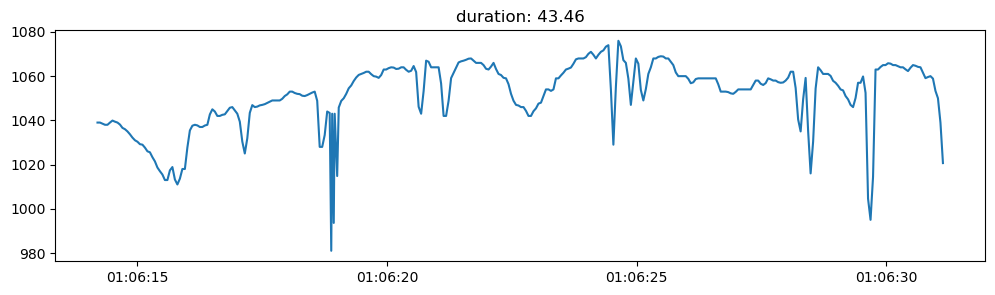

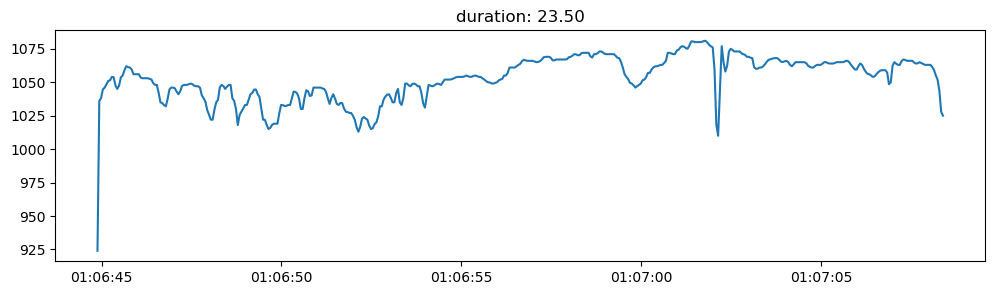

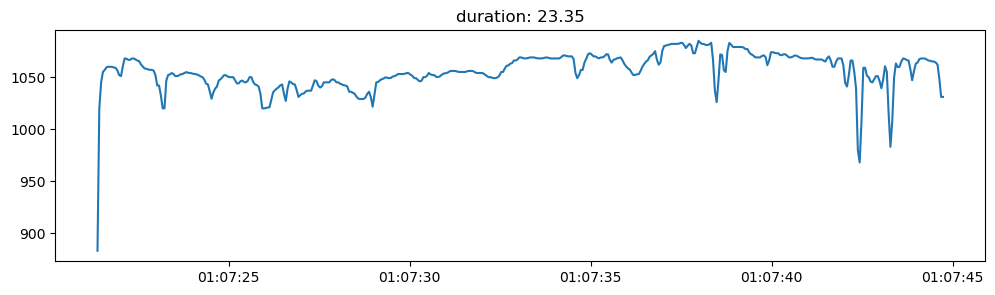

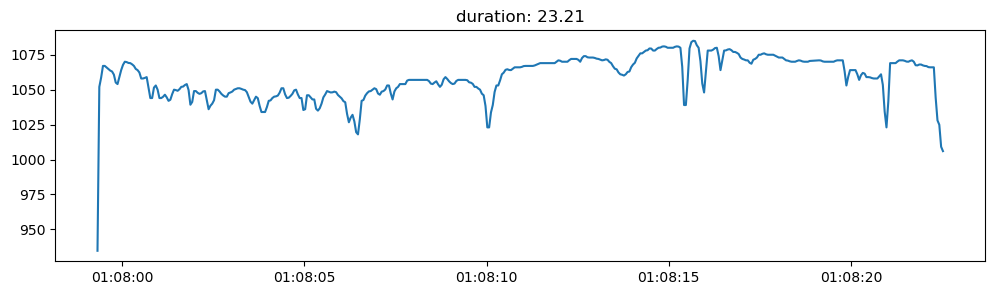

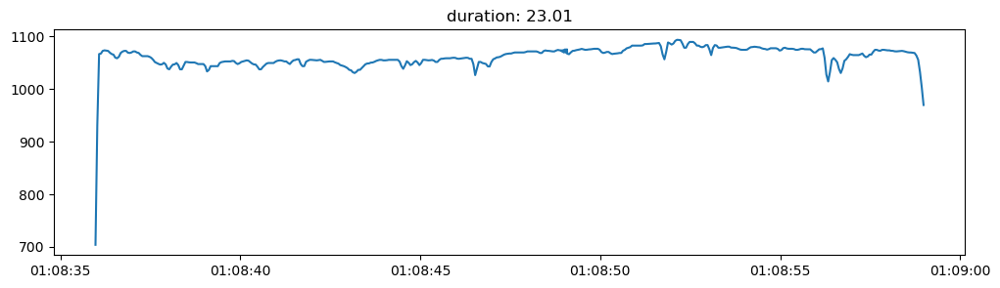

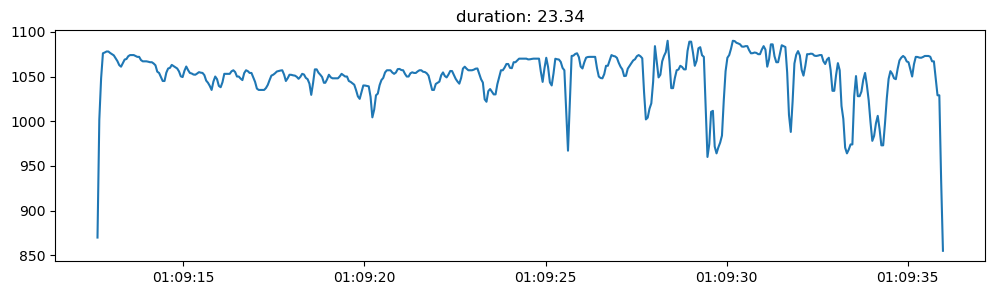

In [12]:
for idx, billet_group in enumerate(billets_groups):
    plot_billet(stand1, billet_group)
    if idx==5:
        break

In [13]:
billet_stats = [get_billet_info(stand1,group) for group in tqdm(billets_groups)]

  0%|          | 0/1740 [00:00<?, ?it/s]

In [14]:
stats = pd.DataFrame(billet_stats)

In [15]:
stats

,start,end,head_mean,head_std,head_min,head_max,stable_0_mean,stable_0_std,stable_0_min,stable_0_max,...,stable_3_min,stable_3_max,stable_4_mean,stable_4_std,stable_4_min,stable_4_max,tail_mean,tail_std,tail_min,tail_max
0,2025-04-24 01:05:47.675529,2025-04-24 01:06:31.134884,NaN,NaN,NaN,NaN,1031.911565,10.323085,1011.0,1046.0,...,1029.0,1076.0000,1058.896420,5.316701,1049.000,1069.0000,1053.959887,14.665469,995.0000,1065.8334
1,2025-04-24 01:06:44.884884,2025-04-24 01:07:08.388042,1046.922468,21.813550,924.0000,1062.0,1036.698678,9.768249,1015.0,1049.0,...,1010.0,1081.0000,1064.124824,3.939613,1054.000,1073.0000,1059.167697,9.479095,1025.0000,1067.0000
2,2025-04-24 01:07:21.379185,2025-04-24 01:07:44.729185,1050.424168,30.771643,883.0000,1068.0,1043.318028,9.275158,1020.0,1054.8,...,1026.0,1085.0000,1063.421027,18.387496,968.000,1079.0000,1053.864084,18.741668,983.0000,1068.0000
3,2025-04-24 01:07:59.319470,2025-04-24 01:08:22.525795,1055.478447,21.793910,934.6667,1070.0,1045.636799,4.854155,1034.0,1054.0,...,1039.0,1085.0000,1069.730871,5.695031,1053.000,1079.0000,1058.388618,18.237935,1006.0000,1071.0000
4,2025-04-24 01:08:35.975795,2025-04-24 01:08:58.983427,1050.863238,63.028302,704.0000,1073.0,1047.684681,5.178302,1033.0,1056.0,...,1056.0,1093.0000,1069.747686,13.706138,1014.000,1080.0000,1063.542970,20.574420,969.3333,1074.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1735,2025-04-24 22:57:06.465478,2025-04-24 22:57:30.233316,1028.828603,10.654884,1015.0000,1051.0,1026.854575,7.138592,1010.0,1041.0,...,1030.0,1060.0000,1043.820576,10.116430,1016.625,1056.0000,1022.117554,80.460203,704.0000,1057.2500
1736,2025-04-24 22:57:43.433316,2025-04-24 22:58:06.885765,1016.389455,14.172542,997.0000,1047.0,1014.740643,8.334664,992.9,1031.0,...,1024.0,1061.8889,1042.342967,11.788009,1016.000,1060.0000,1040.940924,13.281465,998.0000,1053.0000
1737,2025-04-24 22:58:21.313849,2025-04-24 22:58:44.963849,1010.415366,62.793420,771.0000,1051.0,1022.717915,8.549466,1007.0,1042.0,...,1017.0,1062.0000,1042.696538,14.795694,1003.000,1061.6666,1029.817795,35.447948,870.8000,1059.0000
1738,2025-04-24 22:58:58.099167,2025-04-24 22:59:22.012529,1010.168705,55.660197,779.2000,1045.0,1023.823114,8.390282,1003.0,1040.0,...,1041.0,1064.0000,1049.833181,8.234952,1033.000,1063.0000,1029.507803,50.016497,829.0000,1058.0000


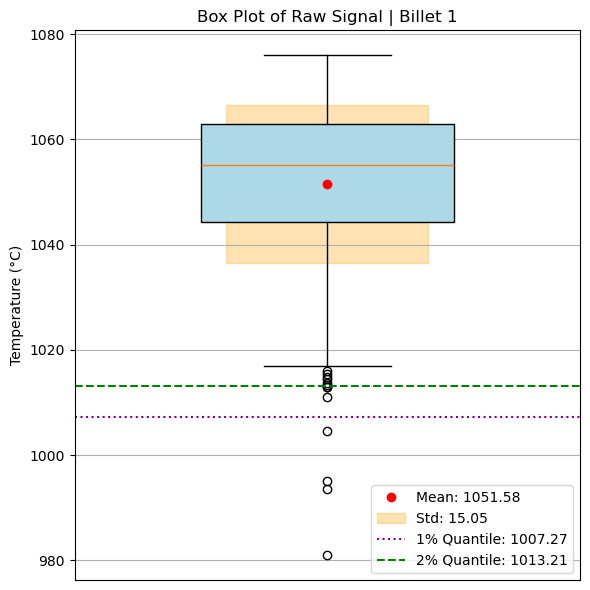

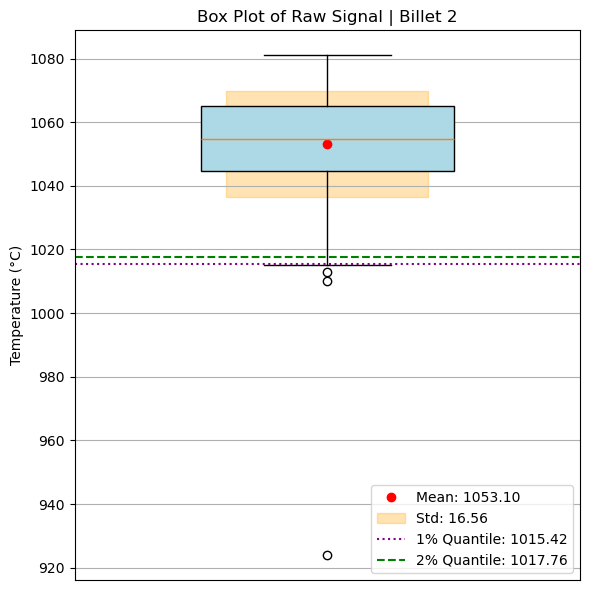

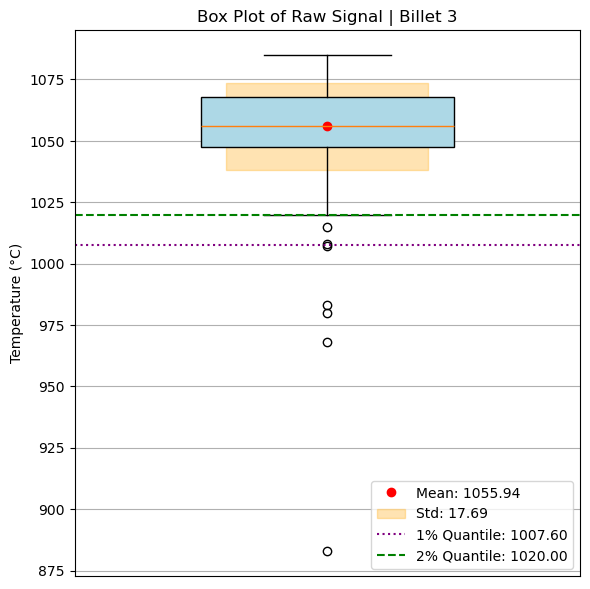

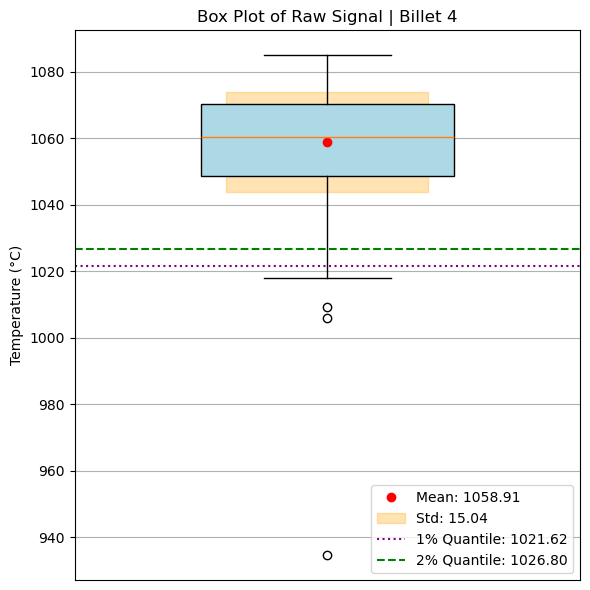

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Loop through each billet and plot box plot for raw signal
for idx, billet_group in enumerate(billets_groups):
    start, end = billet_group['start'], billet_group['end']
    billet_signal = stand1.loc[start:end].copy().dropna()

    if billet_signal.empty:
        print(f"⚠️ Skipping Billet {idx+1}: No valid data.")
        continue

    # Compute statistics
    mean_val = billet_signal.mean()
    std_val = billet_signal.std()
    q1_val = np.percentile(billet_signal, 1)
    q2_val = np.percentile(billet_signal, 2)

    # Box plot
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.boxplot(billet_signal, vert=True, patch_artist=True,
               boxprops=dict(facecolor='lightblue'),
               widths=0.5)

    # Mean point
    ax.plot(1, mean_val, 'ro', label=f'Mean: {mean_val:.2f}')

    # Std deviation shaded area
    ax.fill_betweenx([mean_val - std_val, mean_val + std_val],
                     0.8, 1.2, color='orange', alpha=0.3, label=f'Std: {std_val:.2f}')

    # Quantile lines
    ax.axhline(q1_val, color='purple', linestyle=':', label=f'1% Quantile: {q1_val:.2f}')
    ax.axhline(q2_val, color='green', linestyle='--', label=f'2% Quantile: {q2_val:.2f}')

    # Formatting
    ax.set_xticks([])
    ax.set_ylabel("Temperature (°C)")
    ax.set_title(f"Box Plot of Raw Signal | Billet {idx+1}")
    ax.legend(loc='lower right')
    ax.grid(True, axis='y')

    plt.tight_layout()
    plt.show()

    if idx == 3:
        break


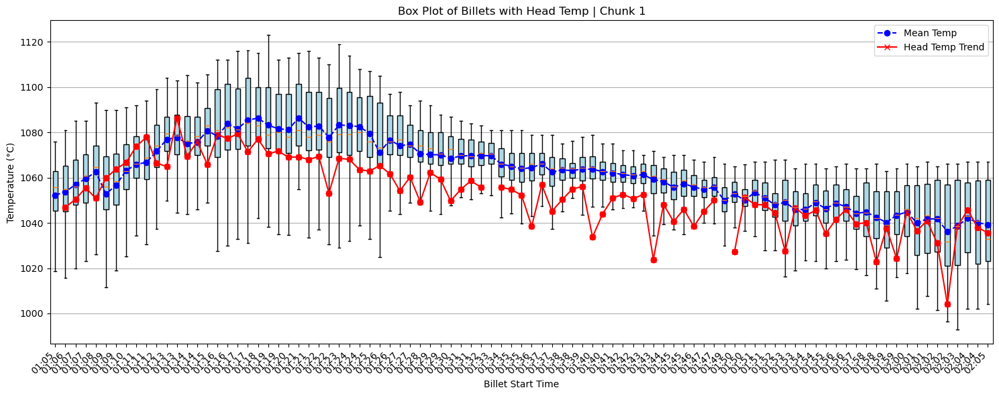

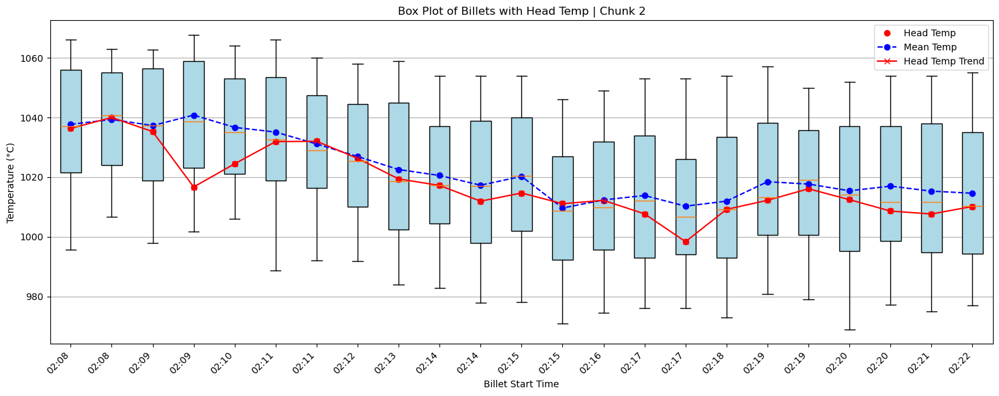

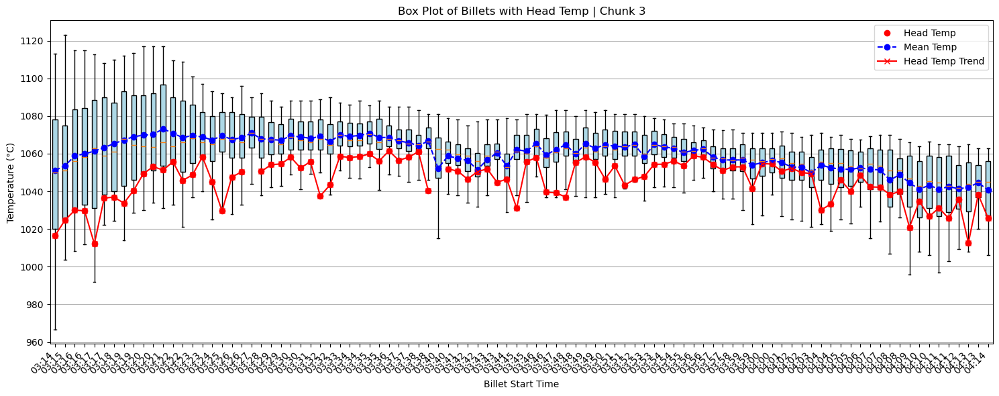

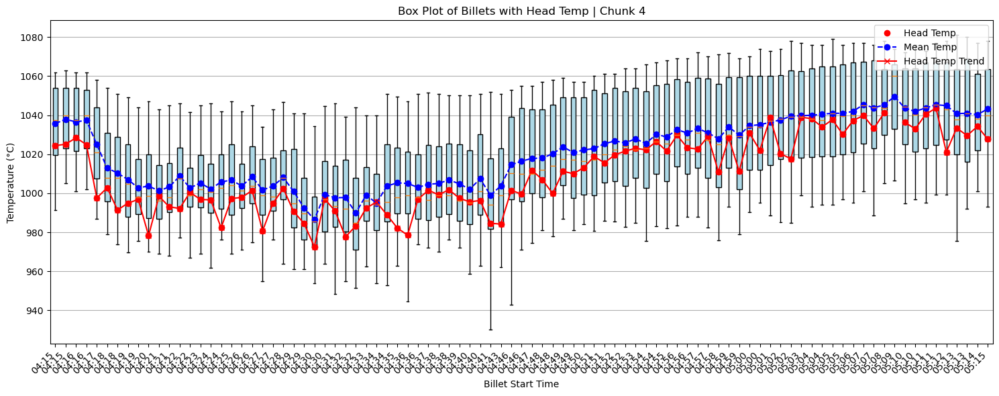

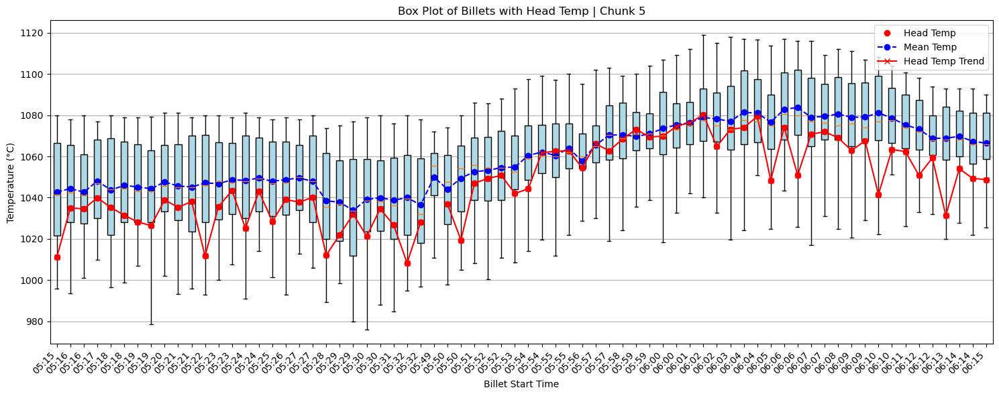

...

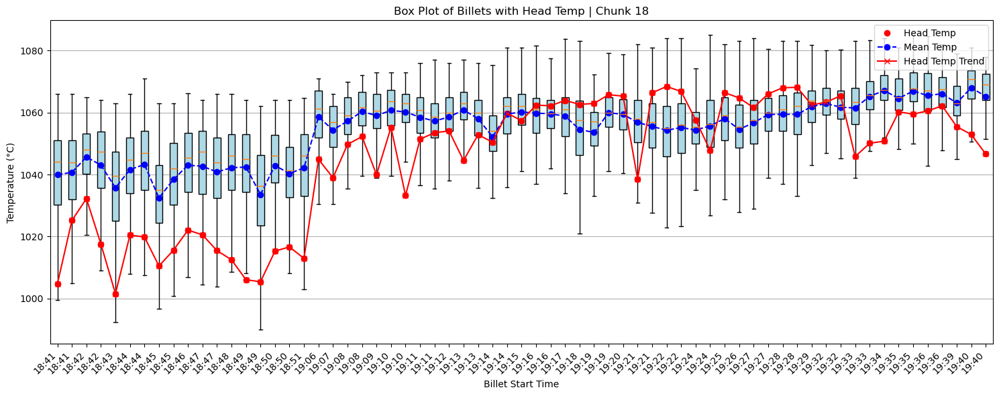

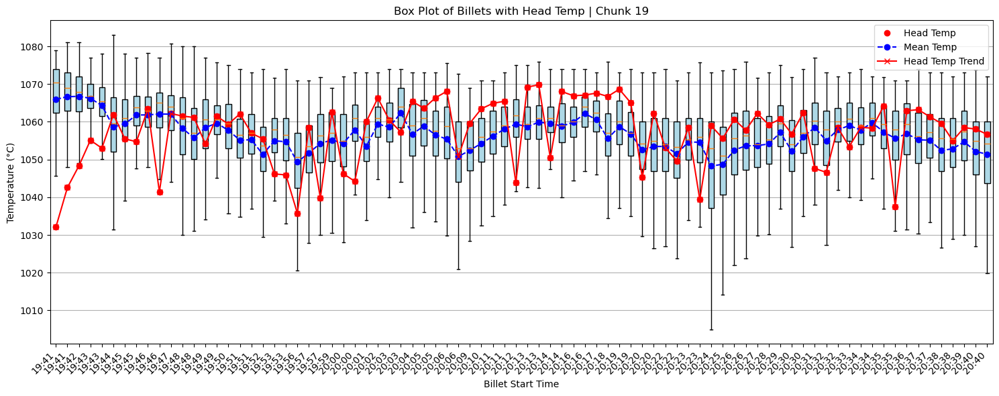

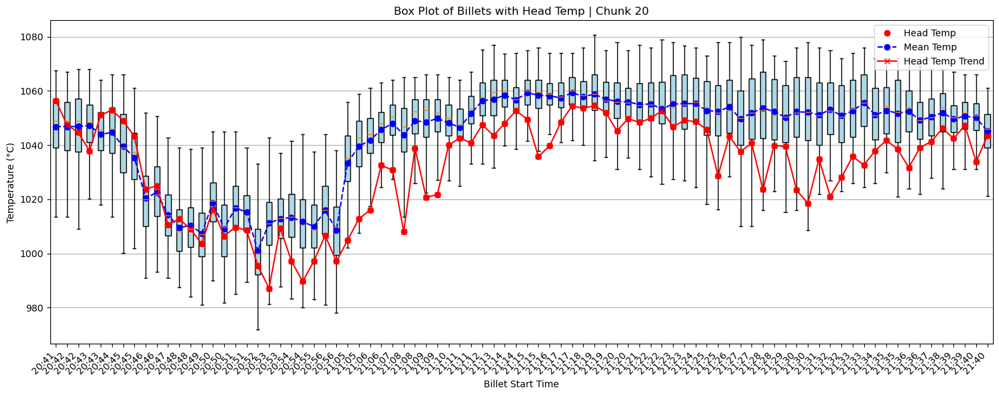

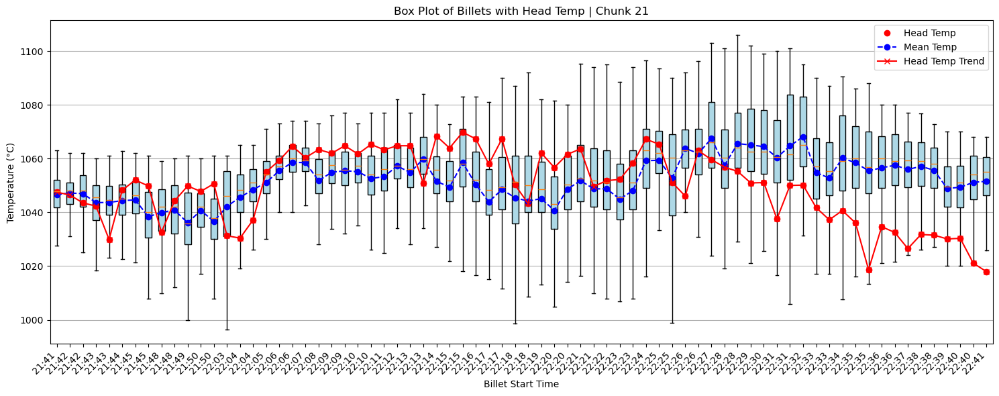

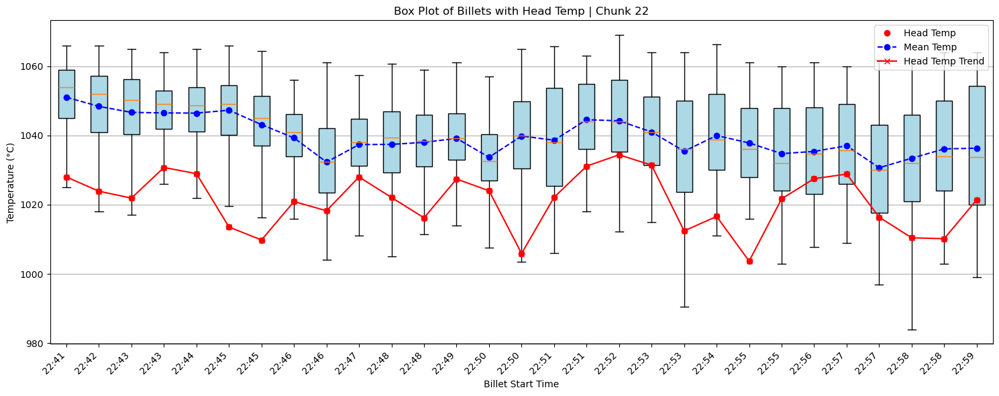

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

chunk_data = []
chunk_timestamps = []
chunk_head_temps = []

current_chunk_data = []
current_chunk_labels = []
current_chunk_heads = []
chunk_start = None

# Loop through each billet
for billet_group in billets_groups:
    start = billet_group['start']
    end = billet_group['end']
    signal = stand1.loc[start:end].dropna()

    if signal.empty:
        continue

    # Truncate outliers below 1st percentile
    q1 = np.percentile(signal, 1)
    signal_filtered = signal[signal >= q1]
    if signal_filtered.empty:
        continue

    # Head temperature: average in first 8% of duration
    duration = (end - start).total_seconds()
    head_end = start + pd.Timedelta(seconds=0.08 * duration)
    head_signal = stand1.loc[start:head_end].dropna()
    head_temp = head_signal.mean() if not head_signal.empty else np.nan

    # Chunk logic (1-hour bins)
    if chunk_start is None:
        chunk_start = start

    if (start - chunk_start) <= timedelta(hours=1):
        current_chunk_data.append(signal_filtered.values)
        current_chunk_labels.append(start.strftime("%H:%M"))
        current_chunk_heads.append(head_temp)
    else:
        # Save current chunk
        if current_chunk_data:
            chunk_data.append(current_chunk_data)
            chunk_timestamps.append(current_chunk_labels)
            chunk_head_temps.append(current_chunk_heads)

        # Reset for new chunk
        chunk_start = start
        current_chunk_data = [signal_filtered.values]
        current_chunk_labels = [start.strftime("%H:%M")]
        current_chunk_heads = [head_temp]

# Save last chunk
if current_chunk_data:
    chunk_data.append(current_chunk_data)
    chunk_timestamps.append(current_chunk_labels)
    chunk_head_temps.append(current_chunk_heads)

# Plotting
for i, (box_chunk, time_labels, head_temps) in enumerate(zip(chunk_data, chunk_timestamps, chunk_head_temps)):
    fig, ax = plt.subplots(figsize=(15, 6))

    # Boxplot
    bp = ax.boxplot(box_chunk, patch_artist=True, widths=0.5,
                    boxprops=dict(facecolor='lightblue'), showfliers=False)

    # Plot head temps as red dots
    for j, temp in enumerate(head_temps):
        if not np.isnan(temp):
            ax.plot(j + 1, temp, 'ro', label='Head Temp' if j == 0 else "")

    # Mean trendline across billets
    means = [np.mean(b) for b in box_chunk]
    ax.plot(range(1, len(means) + 1), means, color='blue', marker='o', linestyle='--', label='Mean Temp')

    # Head temp trendline
    if any(~np.isnan(head_temps)):
        ax.plot(range(1, len(head_temps) + 1), head_temps, color='red', linestyle='-', marker='x', label='Head Temp Trend')

    # Labels & formatting
    ax.set_xticks(np.arange(1, len(time_labels) + 1))
    ax.set_xticklabels(time_labels, rotation=45, ha='right')
    ax.set_title(f"Box Plot of Billets with Head Temp | Chunk {i+1}")
    ax.set_xlabel("Billet Start Time")
    ax.set_ylabel("Temperature (°C)")
    ax.grid(True, axis='y')
    ax.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

In [18]:
pd.set_option('display.max_rows', None)

In [19]:
stand1_torque = df.loc[:,'[9:0]']

In [20]:
stand1_hmd = df.loc[:,'[9.23]']

In [21]:
derivated_signal = stand1_torque * stand1_hmd

In [22]:
def get_torque_start(signal, baseline=900):
    up_mask = (signal == baseline) & (signal.shift(-1) > baseline)
    up_transitions = signal[up_mask].index
    return up_transitions

def get_torque_end(signal, baseline=900):
    mask = (signal == baseline) & (signal.shift(1) > baseline)
    transition_idx = signal[mask].index
    return transition_idx

In [23]:
def get_torque_start(signal, stand1_hmd, hmd_value=1):
    # Detect where hmd_signal == 1 and stand1_torque transitions from baseline to a value greater than baseline
    up_mask = (stand1_hmd == hmd_value) & (stand1_hmd.shift(-1) != hmd_value)
    up_transitions = signal[up_mask].index
    return up_transitions

def get_torque_end(signal, stand1_hmd, hmd_value=0):
    # Detect where hmd_signal == 0 and stand1_torque transitions from baseline to a value less than baseline
    down_mask = (stand1_hmd == hmd_value) & (stand1_hmd.shift(1) != hmd_value)
    down_transitions = signal[down_mask].index
    return down_transitions


In [24]:
stand1_torque_start_time = get_torque_start(stand1_torque, stand1_hmd, hmd_value=1)
stand1_torque_end_times = get_torque_end(stand1_torque, stand1_hmd, hmd_value=0)


In [25]:
stand1_torque_billet_groups = []
for start_time, end_time in zip(stand1_torque_start_time, stand1_torque_end_times[1:]):
    if end_time > start_time:
        stand1_torque_billet_groups.append((start_time - pd.Timedelta(seconds=0.25), end_time + pd.Timedelta(seconds=0.25)))

In [26]:
len(stand1_torque_billet_groups)

1784

In [27]:
def plot_billet(signal, group):
    # Support both dict and tuple input
    if isinstance(group, dict):
        start, end = group['start'], group['end']
    else:
        start, end = group  # assuming it's a (start, end) tuple

    plt.figure(figsize=(12, 3))
    plt.plot(signal.loc[start:end])
    plt.title(f"Stand1 Torque Plot")
    plt.xlabel("Time")
    plt.ylabel("Signal Value")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


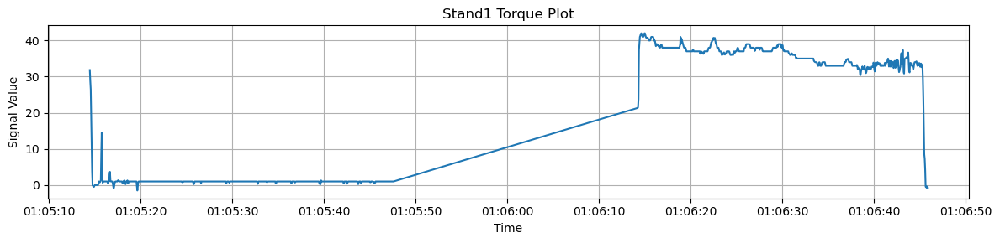

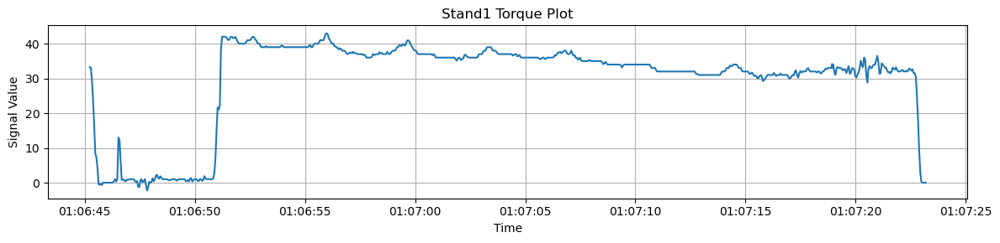

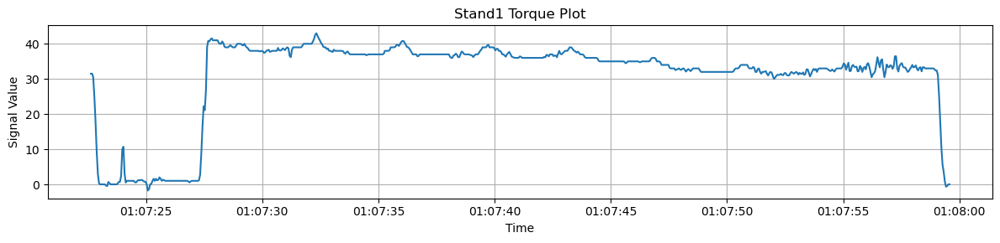

In [28]:
for idx, billet_group in enumerate(stand1_torque_billet_groups):
    plot_billet(stand1_torque, billet_group)
    if idx==2:
        break

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


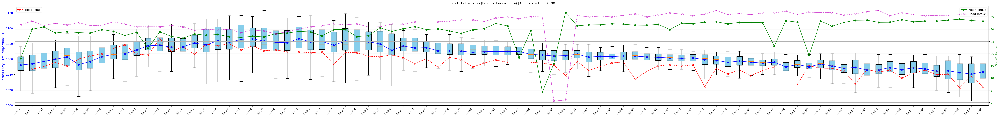

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


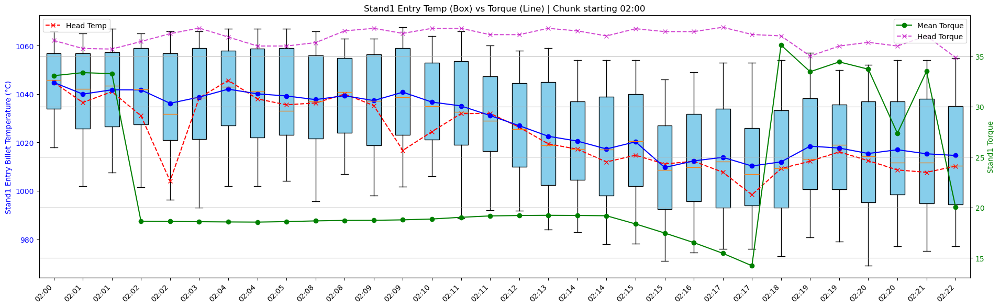

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


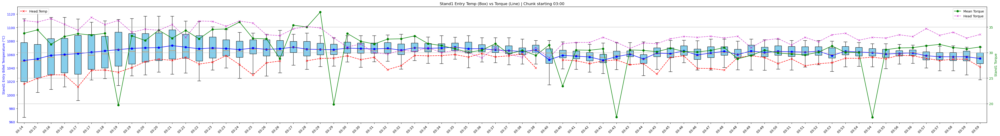

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


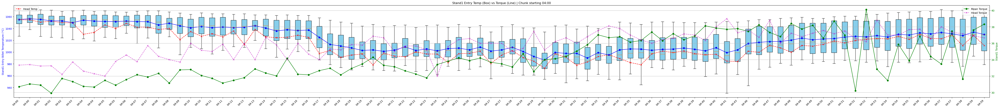

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


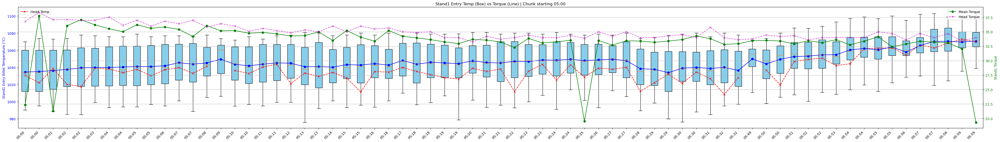

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


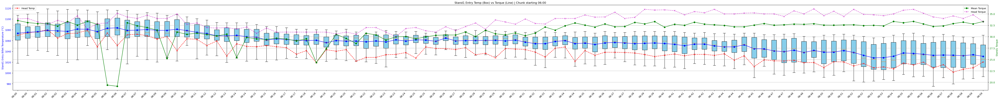

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


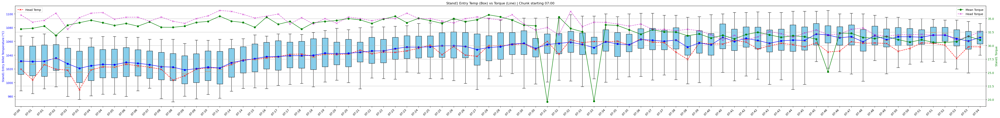

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


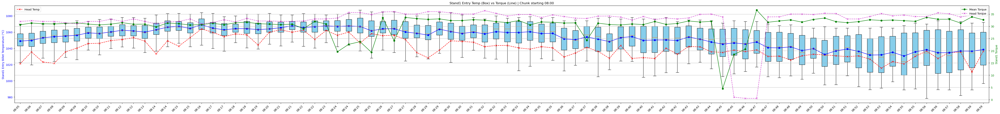

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


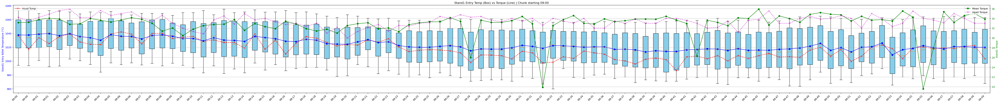

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


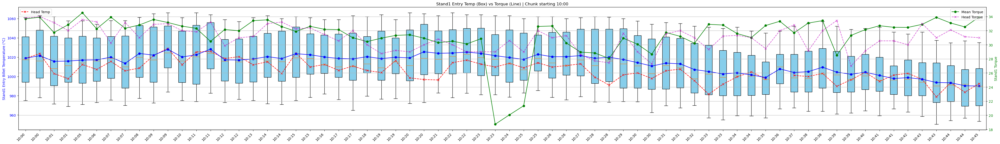

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


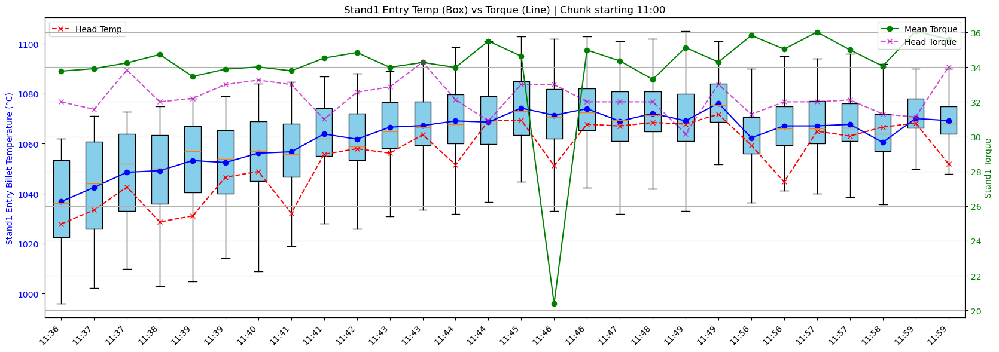

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


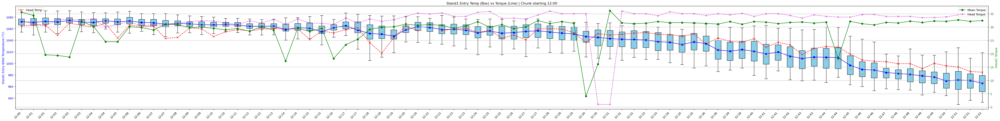

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


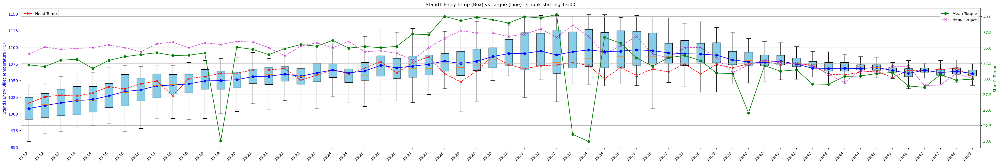

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


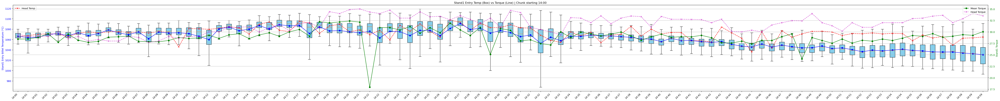

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


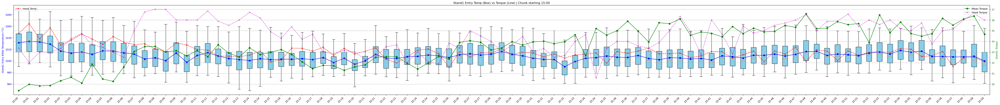

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


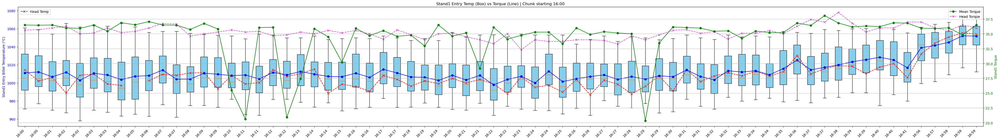

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


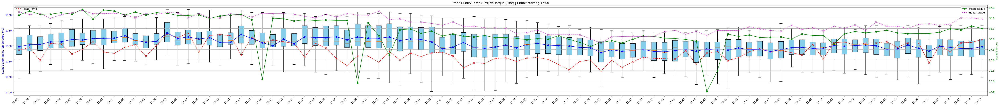

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


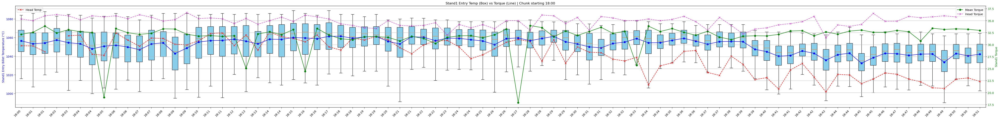

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


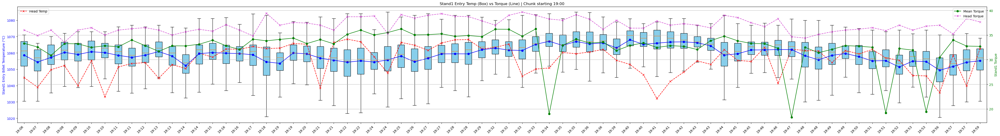

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


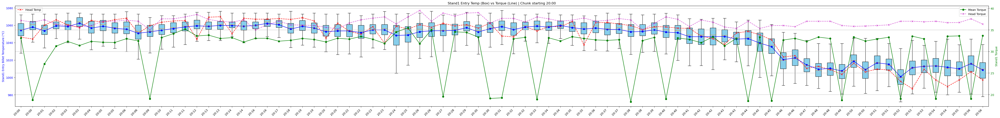

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


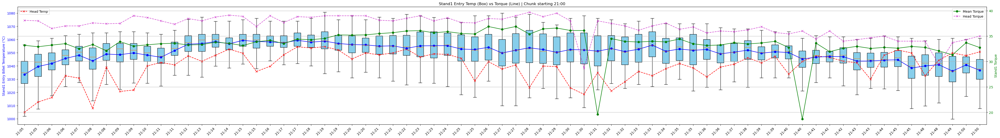

/tmp/ipykernel_998606/1443489056.py:81: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--x" (-> color='r'). The keyword argument will take precedence.
  ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')


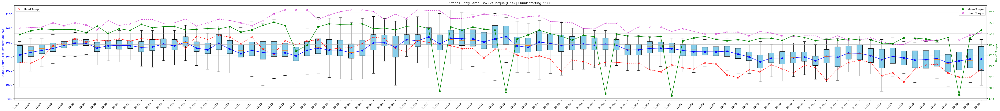

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import timedelta

# -------- Preprocess and align data by hourly chunks --------
combined_chunks = {}

for i, billet_group in enumerate(billets_groups):
    start = billet_group['start']
    end = billet_group['end']
    torque_start, torque_end = stand1_torque_billet_groups[i] if i < len(stand1_torque_billet_groups) else (None, None)

    if start is None or end is None or torque_start is None or torque_end is None:
        continue

    # Hourly chunking key
    chunk_key = start.replace(minute=0, second=0, microsecond=0)
    combined_chunks.setdefault(chunk_key, []).append({
        'temp_start': start,
        'temp_end': end,
        'torque_start': torque_start,
        'torque_end': torque_end
    })

# -------- Plotting for each hourly chunk --------
for chunk_start, chunk_billets in combined_chunks.items():
    temp_box_data = []
    temp_labels = []
    head_temps = []
    mean_torques = []
    head_torques = []

    for billet in chunk_billets:
        # Temperature signal (with 1% outlier truncation)
        signal_temp = stand1.loc[billet['temp_start']:billet['temp_end']].dropna()
        q1 = np.percentile(signal_temp, 1) if not signal_temp.empty else None
        signal_temp = signal_temp[signal_temp >= q1] if q1 is not None else signal_temp

        # Head temp (first 8% duration)
        dur_sec = (billet['temp_end'] - billet['temp_start']).total_seconds()
        head_end = billet['temp_start'] + pd.Timedelta(seconds=0.08 * dur_sec)
        head_temp_signal = stand1.loc[billet['temp_start']:head_end].dropna()
        head_temp = head_temp_signal.mean() if not head_temp_signal.empty else np.nan

        # Torque signal and stats
        signal_torque = stand1_torque.loc[billet['torque_start']:billet['torque_end']].dropna()
        if signal_torque.empty:
            continue

        torque_mean = signal_torque.mean()
        torque_head = signal_torque.iloc[0]

        # Skip empty cases
        if signal_temp.empty or np.isnan(torque_mean):
            continue

        # Collect data
        temp_box_data.append(signal_temp.values)
        temp_labels.append(billet['temp_start'])
        head_temps.append(head_temp)
        mean_torques.append(torque_mean)
        head_torques.append(torque_head)

    if not temp_box_data:
        continue

    # -------- Plotting --------
    fig, ax1 = plt.subplots(figsize=(max(12, len(temp_box_data) * 0.6), 6))

    # Boxplot for Temperature
    ax1.boxplot(temp_box_data, patch_artist=True, widths=0.5,
                boxprops=dict(facecolor='skyblue'), showfliers=False)
    ax1.set_ylabel("Stand1 Entry Billet Temperature (°C)", color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_xticks(range(1, len(temp_labels)+1))
    ax1.set_xticklabels([ts.strftime('%H:%M') for ts in temp_labels], rotation=45, ha='right')

    # Head temp trend
    ax1.plot(range(1, len(head_temps)+1), head_temps, 'r--x', label='Head Temp', color='red')
    ax1.legend(loc='upper left')

    # Mean line for temp
    temp_means = [np.mean(data) for data in temp_box_data]
    ax1.plot(range(1, len(temp_means)+1), temp_means, 'b-o', label='Mean Temp')

    # Torque on secondary y-axis
    ax2 = ax1.twinx()
    x = range(1, len(mean_torques)+1)

    # Mean Torque
    ax2.plot(x, mean_torques, 'g-o', label='Mean Torque')

    # Head Torque
    ax2.plot(x, head_torques, 'm--x', label='Head Torque', alpha=0.7)

    ax2.set_ylabel("Stand1 Torque", color='green')
    ax2.tick_params(axis='y', labelcolor='green')
    ax2.legend(loc='upper right')

    # Title & Layout
    plt.title(f"Stand1 Entry Temp (Box) vs Torque (Line) | Chunk starting {chunk_start.strftime('%H:%M')}")
    plt.tight_layout()
    plt.grid(True, axis='y')
    plt.show()


In [30]:
import pandas as pd
import numpy as np

# Define full-day time window
start_time = pd.to_datetime("2025-04-24 01:00:00")
end_time = pd.to_datetime("2025-04-24 23:00:00")

# Thresholds
TEMP_LOW, TEMP_HIGH = 1015, 1085
TORQUE_LOW, TORQUE_HIGH = 29, 38
TEMP_DEV_THRESHOLD = 70
TORQUE_DEV_THRESHOLD = 7

# Global means
global_temp_mean = df['[13:0]'].mean()
global_torque_mean = df['[9:0]'].mean()

# Placeholder for alert results
alerts = []

# Loop through each billet and apply logic
for i in range(min(len(billets_groups), len(stand1_torque_billet_groups))):
    temp_start = billets_groups[i]['start']
    temp_end = billets_groups[i]['end']
    torque_start, torque_end = stand1_torque_billet_groups[i]

    # Check if billet falls within the time range
    if not (start_time <= temp_start <= end_time):
        continue

    # Extract signals (without truncation)
    temp_signal = df['[13:0]'].loc[temp_start:temp_end].dropna()
    torque_signal = df['[9:0]'].loc[torque_start:torque_end].dropna()

    if temp_signal.empty or torque_signal.empty:
        continue

    # Threshold logic
    temp_out_of_range = (temp_signal.min() < TEMP_LOW) or (temp_signal.max() > TEMP_HIGH)
    torque_out_of_range = (torque_signal.min() < TORQUE_LOW) or (torque_signal.max() > TORQUE_HIGH)

    # Deviation from historical mean
    temp_mean = temp_signal.mean()
    torque_mean = torque_signal.mean()

    temp_dev_trigger = temp_mean < (global_temp_mean - TEMP_DEV_THRESHOLD)
    torque_dev_trigger = torque_mean < (global_torque_mean - TORQUE_DEV_THRESHOLD)

    # Final alert condition (AND logic)
    if temp_out_of_range and torque_out_of_range and temp_dev_trigger and torque_dev_trigger:
        alerts.append({
            'Billet Index': i,
            'Start Time': temp_start,
            'Temp Mean': temp_mean,
            'Torque Mean': torque_mean,
            'Temp Dev': global_temp_mean - temp_mean,
            'Torque Dev': global_torque_mean - torque_mean
        })

# Result
alert_df = pd.DataFrame(alerts)
print(f"✅ Total Alerts Generated (without truncation): {len(alert_df)}")
alert_df


✅ Total Alerts Generated (without truncation): 0


""


In [31]:
import pandas as pd
import numpy as np

# Define full-day time window
start_time = pd.to_datetime("2025-04-24 01:00:00")
end_time = pd.to_datetime("2025-04-24 23:00:00")

# Thresholds
TEMP_LOW, TEMP_HIGH = 1015, 1085
TORQUE_LOW, TORQUE_HIGH = 29, 38
TEMP_DEV_THRESHOLD = 70
TORQUE_DEV_THRESHOLD = 7

# Global means
global_temp_mean = df['[13:0]'].mean()
global_torque_mean = df['[9:0]'].mean()

# Placeholder for alert results
alerts = []

# Loop through each billet and apply logic
for i in range(min(len(billets_groups), len(stand1_torque_billet_groups))):
    temp_start = billets_groups[i]['start']
    temp_end = billets_groups[i]['end']
    torque_start, torque_end = stand1_torque_billet_groups[i]

    # Check if billet falls within the time range
    if not (start_time <= temp_start <= end_time):
        continue

    # Extract signals
    temp_signal = df['[13:0]'].loc[temp_start:temp_end].dropna()
    torque_signal = df['[9:0]'].loc[torque_start:torque_end].dropna()

    if temp_signal.empty or torque_signal.empty:
        continue

    # Truncate 1% outliers for robustness
    temp_signal = temp_signal[(temp_signal > temp_signal.quantile(0.01)) &
                              (temp_signal <= temp_signal.quantile(0.99))]
    torque_signal = torque_signal[(torque_signal > torque_signal.quantile(0.01)) &
                                  (torque_signal <= torque_signal.quantile(0.99))]

    if temp_signal.empty or torque_signal.empty:
        continue

    # Check range thresholds
    temp_out_of_range = (temp_signal.min() < TEMP_LOW) or (temp_signal.max() > TEMP_HIGH)
    torque_out_of_range = (torque_signal.min() < TORQUE_LOW) or (torque_signal.max() > TORQUE_HIGH)

    # Check deviation from global means
    temp_mean = temp_signal.mean()
    torque_mean = torque_signal.mean()

    temp_dev_trigger = temp_mean < (global_temp_mean - TEMP_DEV_THRESHOLD)
    torque_dev_trigger = torque_mean < (global_torque_mean - TORQUE_DEV_THRESHOLD)

    # Final AND condition for alert
    if temp_out_of_range and torque_out_of_range and temp_dev_trigger and torque_dev_trigger:
        alerts.append({
            'Billet Index': i,
            'Start Time': temp_start,
            'Temp Mean': temp_mean,
            'Torque Mean': torque_mean,
            'Temp Dev': global_temp_mean - temp_mean,
            'Torque Dev': global_torque_mean - torque_mean
        })

# Convert to DataFrame
alert_df = pd.DataFrame(alerts)
print(f"✅ Total Alerts Generated: {len(alert_df)}")
alert_df


✅ Total Alerts Generated: 0


""
